# Flare Line Diagnostics

Here, we assess the SNR in a number of flare lines for classes M1 and above

In [1]:
import asdf
from astropy.coordinates import SkyCoord
import astropy.table
import astropy.units as u
from astropy.visualization import quantity_support
from astropy.wcs.utils import wcs_to_celestial_frame
import fiasco
import matplotlib.pyplot as plt
import ndcube
import numpy as np
from scipy.interpolate import interp1d
from sunpy.coordinates import get_earth

from mocksipipeline.modeling import convolve_with_response, _blur_spectra
from mocksipipeline.instrument.configuration import moxsi_slot_spectrogram_pinhole, moxsi_slot

In [2]:
def annotate_lines(axis, line_list, flux, color, unit=None, rtol=0.1):
    wavelength = flux.axis_world_coords(0)[0]
    data = flux.to(flux.unit if unit is None else unit).data
    for row in line_list:
        i_x = flux.wcs.world_to_array_index(u.Quantity([row['wavelength']]))
        if data[i_x] / data.max() < rtol:
            continue
        axis.annotate(
            f'{row["ion name"]}, {row["wavelength"].to_string(format="latex_inline", precision=5)}',
            (wavelength[i_x].to_value(), data[i_x]),
            xytext=(0, 150),
            textcoords='offset points',
            rotation=90,
            color=color,
            horizontalalignment='center',
            verticalalignment='center',
            arrowprops=dict(color=color, arrowstyle='-', ls='--'),
        )

## Creating a flare line list

Load the line list and estimate the MOXSI flux from the CHIANTI intensities

In [4]:
channel_o1 = moxsi_slot_spectrogram_pinhole.channel_list[12]

In [5]:
channel_o1

MOXSI Detector Channel--spectrogram_pinhole
-----------------------------------
Spectral order: 1
Filter: Al+Al2O3, 150.000 nm
Detector dimensions: (1504, 2000)
Wavelength range: [0.0 Angstrom, 83.61862217082933 Angstrom]
Spectral plate scale: 0.07179487179487179 Angstrom / pix
Spatial plate scale: [7.40437766 7.40437766] arcsec / pix
Reference pixel: [1000.  752.    0.] pix
aperture: Circular Aperture
-------------------------
diameter: 44.0 micron
area: 1.5205308443374597e-05 cm2


In [6]:
earth_obs = get_earth('2020-01-01')
hpc_frame = wcs_to_celestial_frame(channel_o1.get_wcs(earth_obs))
source_loc = SkyCoord(Tx=0*u.arcsec, Ty=0*u.arcsec, frame=hpc_frame)

  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


First, load the line list and convert intensities to units of the MOXSI detector. Note that we can carry out a similar process for the AR case using the AR intensity and the lower energy flare classes.

In [7]:
full_line_list = astropy.table.QTable.read('../data/line_lists/full-line-list.asdf')
full_line_list = full_line_list[['ion name',
                                 'wavelength',
                                 'max temperature_flare_ext',
                                 'intensity (coronal)_flare_ext',
                                 'intensity (coronal)_active_region']]
full_line_list['energy'] = full_line_list['wavelength'].to('keV', equivalencies=u.spectral())
# Convert intensities to instrument units
f_ea_interp = interp1d(channel_o1.wavelength.to_value('AA'), channel_o1.effective_area.to_value('cm2'),)
ea_interp = f_ea_interp(full_line_list['wavelength'].to_value('AA')) * u.cm**2
full_line_list['intensity (coronal)_flare_ext'] = (full_line_list['intensity (coronal)_flare_ext'] *
                                                   ea_interp * channel_o1.pixel_solid_angle)
full_line_list.rename_column('intensity (coronal)_flare_ext', r'flare\_ext')
full_line_list['intensity (coronal)_active_region'] = (full_line_list['intensity (coronal)_active_region'] *
                                                       ea_interp * channel_o1.pixel_solid_angle).to('ph/pix/h')
full_line_list.rename_column('intensity (coronal)_active_region', r'active\_region')
# Add approximate formation temperature
temperature_grid = 10**np.arange(5.5,7.5,0.05)*u.K
all_chianti_ions = [fiasco.Ion(i, temperature_grid) for i in fiasco.list_ions(fiasco.defaults['hdf5_dbase_root'])]
ioneq_tmax = {i.ion_name_roman: i.formation_temperature for i in all_chianti_ions}
full_line_list['$T_{max}$'] = list(map(lambda x: ioneq_tmax[x].to('MK'), full_line_list['ion name']))
# Add FIP information
all_chianti_elements = [fiasco.Element(el, 1*u.MK) for el in fiasco.list_elements(fiasco.defaults['hdf5_dbase_root'])]
element_fip = {el.atomic_symbol: el[0].ip for el in all_chianti_elements}
full_line_list['IP'] = list(map(lambda x: element_fip[x.split()[0]].to('eV'), full_line_list['ion name']))
full_line_list['FIP'] = list(map(lambda x: 'low' if x<=10*u.eV else 'high', full_line_list['IP']))
# Add information about which moxsi pixel corresponds to which wavelength
full_line_list['MOXSI pixel'] = channel_o1.get_wcs(earth_obs).world_to_array_index(source_loc, full_line_list['wavelength'])[-1]
# Reorder columns
full_line_list = full_line_list[[
    'ion name',
    'wavelength',
    'energy',
    'MOXSI pixel',
    '$T_{max}$',
    'IP',
    'FIP',
    r'flare\_ext',
]]
full_line_list.sort(keys='wavelength')

/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/astropy/units/equivalencies.py:141: RuntimeWarning: divide by zero encountered in divide
  (si.m, si.J, lambda x: hc / x),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:253: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  ef1f2 = (np.array(res[self.name+'_E']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:254: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  np.array(res[self.name+'_f1']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:255: UserWarning: Readi

We want to avoid cases where we include lines that are actually weak, but get grouped into the same pixel as strong lines and thus appear as if they're just as strong. Thus, we'll group by MOXSI pixel and if a particular line is significantly below that line in that pixel, then we drop that line

In [9]:
max_threshold = 0.05
group_tables = []
for group in full_line_list.group_by('MOXSI pixel').groups:
    group_tables.append(group[group['flare\\_ext'] >= group['flare\\_ext'].max() * max_threshold])
full_line_list = astropy.table.vstack(group_tables)

Then, load the reference flare spectra

In [10]:
goes_class = ['m1', 'm5', 'x5']
flare_spectra = []
with asdf.open('../data/reference_spectra/caspi_flare_spectra.asdf', copy_arrays=True) as af:
    for gc in goes_class:
        flare_spectra.append((gc, ndcube.NDCube(af.tree[gc]['data'], wcs=af.tree[gc]['wcs'])))
flare_spectra = ndcube.NDCollection(flare_spectra, aligned_axes=(0,))

Now, compute the MOXSI counts for a source location at disk center as a function of pixel

First, let's just look at the flux in each line in first order

In [11]:
flux_columns = {}
for gc in goes_class:
    flux = convolve_with_response(flare_spectra[gc], channel_o1, include_gain=False)
    #flux = _blur_spectra(flux, blur / channel_o1.spatial_plate_scale[0] * channel_o1.spectral_plate_scale, channel_o1)
    #indices = flux.wcs.world_to_array_index(full_line_list['wavelength'])
    # NOTE: Calling w2ai on an array when the WCS is 1D reverses the order of the returned indices (!!!)
    #indices = np.array(indices)[::-1]
    f_interp = interp1d(flux.axis_world_coords(0)[0].to_value('AA'), flux.data, kind='nearest')
    flux_columns[gc.capitalize()] = (f_interp(full_line_list['wavelength'].to_value('AA'))*flux.unit).to('ph/pix/s')
flare_snr_table = astropy.table.QTable(flux_columns)
flare_snr_table = astropy.table.hstack([full_line_list,flare_snr_table])
flare_snr_table.sort(keys='wavelength')

/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/astropy/units/equivalencies.py:141: RuntimeWarning: divide by zero encountered in divide
  (si.m, si.J, lambda x: hc / x),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:253: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  ef1f2 = (np.array(res[self.name+'_E']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:254: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  np.array(res[self.name+'_f1']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:255: UserWarning: Readi

The next thing we need to do is make a cut in SNR to eliminate those lines we don't have a chance of seeing. We require that this threshold be met at the M1 level and above

In [12]:
threshold = 0.1 * u.photon / u.pix / u.s

In [13]:
flare_snr_table = flare_snr_table[flare_snr_table['M1'] > threshold]

Finally, now that we've really pared down the table, let's compute a $T_{max}$ based on the contribution function

In [14]:
contribution_functions = {}
for ion_name in np.unique(flare_snr_table['ion name']):
    ion = fiasco.Ion(ion_name, temperature_grid)
    #density = 1e15*u.K/(u.cm**3)/ion.temperature
    density = 1e10 * u.cm**(-3)
    goft = ion.contribution_function(density, couple_density_to_temperature=False)
    transitions = ion.transitions.wavelength[~ion.transitions.is_twophoton]
    contribution_functions[ion_name] = (transitions, goft)
goft_col = []
for row in flare_snr_table:
    _t, _g = contribution_functions[row['ion name']]
    idx = np.argmin(np.abs(_t - row['wavelength']))
    goft_col.append(_g[:,0,idx])
flare_snr_table['$T_{max,G}$'] = list(map(lambda x: temperature_grid[np.argmax(x)].to('MK'), goft_col))

One last reordering of the columns

In [15]:
flare_snr_table = flare_snr_table[[
    'ion name',
    'wavelength',
    'energy',
    'MOXSI pixel',
    '$T_{max}$',
    '$T_{max,G}$',
    'IP',
    'FIP',
    r'flare\_ext',
    'M1',
    'M5',
    'X5',
]]
flare_snr_table.sort(keys='wavelength')

In [18]:
flare_snr_table

ion name,wavelength,energy,MOXSI pixel,$T_{max}$,"$T_{max,G}$",IP,FIP,flare\_ext,M1,M5,X5
,Angstrom,keV,,MK,MK,eV,,ph / (pix s),ph / (pix s),ph / (pix s),ph / (pix s)
str9,float64,float64,int64,float64,float64,float64,str4,float64,float64,float64,float64
Si XIV,6.1803998947143555,2.0060869934845944,1086,12.589254117941508,15.848931924610914,8.151683322378426,low,2.77150168778808,0.19092068163432263,0.7726231879135387,5.958959528393517
Si XIV,6.185800075531006,2.0043356868845636,1086,12.589254117941508,15.848931924610914,8.151683322378426,low,1.3860111467366312,0.19092068163432263,0.7726231879135387,5.958959528393517
Si XIII,6.647900104522705,1.8650129587364168,1093,4.466835921509589,9.999999999999877,8.151683322378426,low,2.5822871994428858,0.3885113286497903,1.698976270422117,16.01591653315726
Si XIII,6.688199996948242,1.853775283181917,1093,4.466835921509589,8.91250938133735,8.151683322378426,low,0.3761381491317149,0.10098502280776257,0.44102727439977624,4.266389879196875
Mg XII,7.105800151824951,1.7448309238102893,1099,7.943282347242723,9.999999999999877,7.646231981257862,low,0.17467006358746945,0.1656320158333378,0.7183016932647145,6.601093936462812
Mg XII,7.106900215148926,1.7445608448099217,1099,7.943282347242723,9.999999999999877,7.646231981257862,low,0.08751833495453741,0.1656320158333378,0.7183016932647145,6.601093936462812
Al XII,7.757299900054932,1.5982906427573111,1108,3.548133892335724,7.943282347242723,5.985755006111463,low,0.08337538277386186,0.18914877351453044,0.809461063592222,7.7635870033849725
Mg XI,9.231200218200684,1.3430994399704055,1129,2.818382931264432,6.309573444801865,7.646231981257862,low,0.0927484731152775,0.32627721731984916,1.380182779037875,13.309287922783925


Now, save the line table 

In [19]:
flare_snr_table.write('../data/line_lists/flare-line-table.asdf')

## Assessing Relationship between formation temperature and IP

Plot ionization potential versus formation temperature

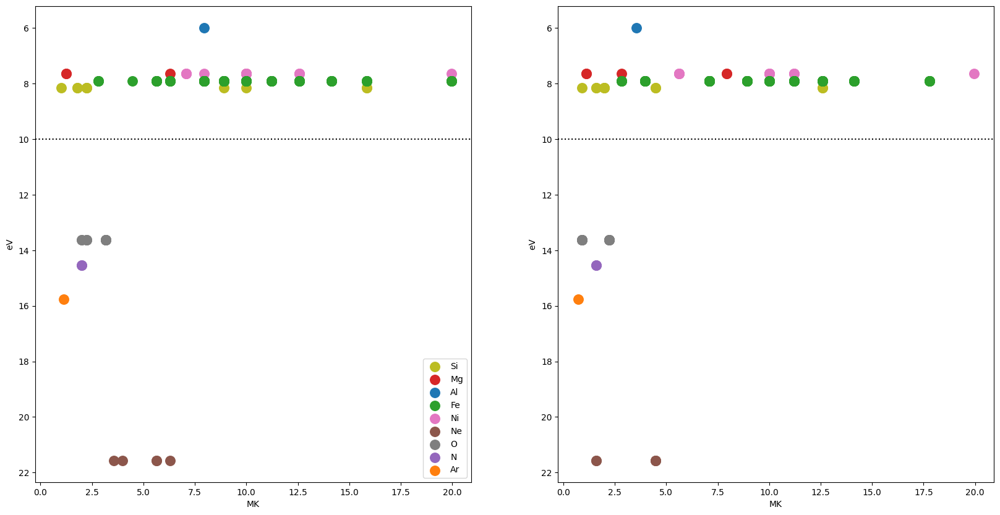

In [15]:
el_colors = {el: f'C{i}' for i,el in enumerate(np.unique(list(map(lambda x: x.split()[0], flare_snr_table['ion name']))))}
with quantity_support():
    fig = plt.figure(figsize=(20,10))
    # Contribution function
    ax = fig.add_subplot(121)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='.',
                   s=500,
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['X5']*1e3,
                   #alpha=0.25,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    ax.invert_yaxis()
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(),loc=4)
    # Ionization fraction
    ax = fig.add_subplot(122,sharex=ax,sharey=ax)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max}$'], row['IP'],
                   marker='.',
                   s=500,
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['X5']*1e3,
                   #alpha=0.25,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')

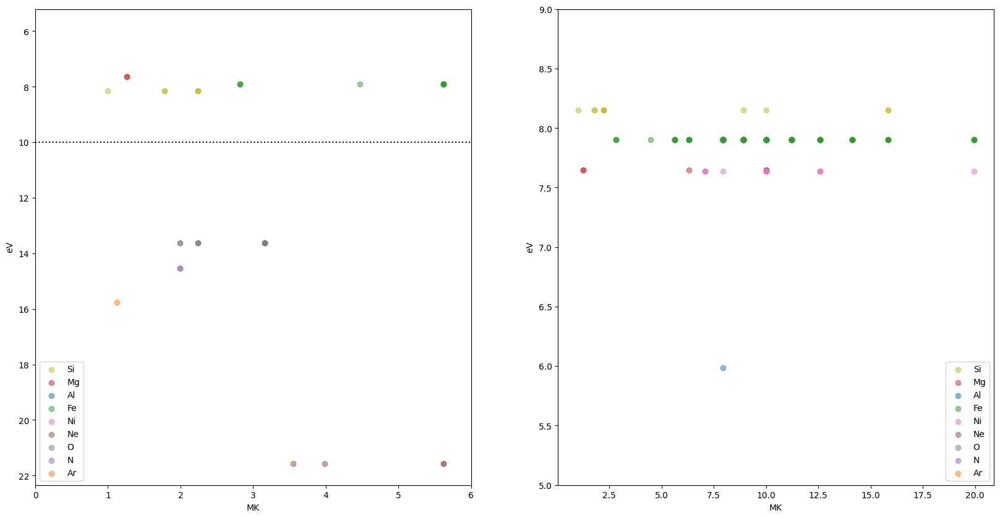

In [16]:
with quantity_support():
    fig = plt.figure(figsize=(20,10))
    # Compare high and low FIP
    ax = fig.add_subplot(121)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='o',
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['M5']*1e3,
                   alpha=0.5,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc=3)
    ax.set_xlim(0,6)
    ax.invert_yaxis()
    # Compare temperature coverage
    ax = fig.add_subplot(122)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='o',
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['M5']*1e3,
                   alpha=0.5,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc=4)
    ax.set_ylim(5,9)

## Assessing $G(T)$ ratio for High and Low FIP Pairs

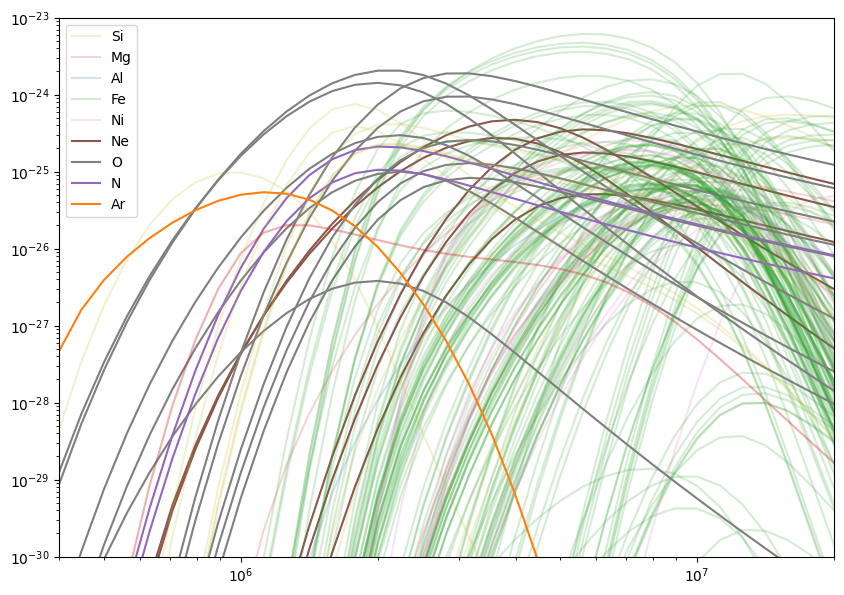

In [17]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
for goft,ion_name,fip in zip(goft_col, flare_snr_table['ion name'], flare_snr_table['FIP']):
    ax.plot(temperature_grid, goft, color=el_colors[ion_name.split()[0]], alpha=0.2 if fip=='low' else 1.0, label=ion_name.split()[0])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(1e-30, 1e-23)
ax.set_xlim(4e5, 2e7)
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

Maybe take ratios between the contribution functions of the high-FIP elements? Which ones are the most flat across the relevant temperature ranges?

In [18]:
modded_table = flare_snr_table.copy()
modded_table['contribution function'] = goft_col

In [19]:
low_fip_lines = modded_table[modded_table['FIP']=='low']
high_fip_lines = modded_table[modded_table['FIP']=='high']

In [20]:
from cycler import cycler
ls_cycler = cycler(linestyle=['-', '--', ':', '-.', (5, (10, 3))])
el_linestyles = {el: ls for el,ls in zip(np.unique(list(map(lambda x: x.split()[0], low_fip_lines['ion name']))), ls_cycler)}

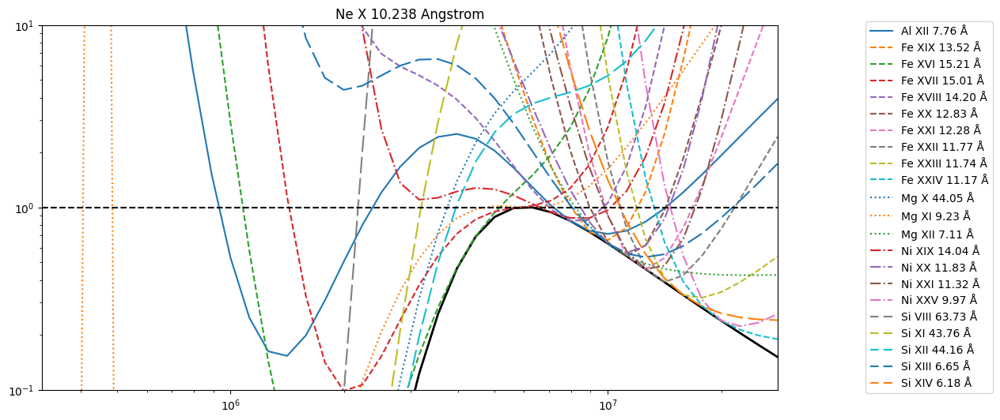

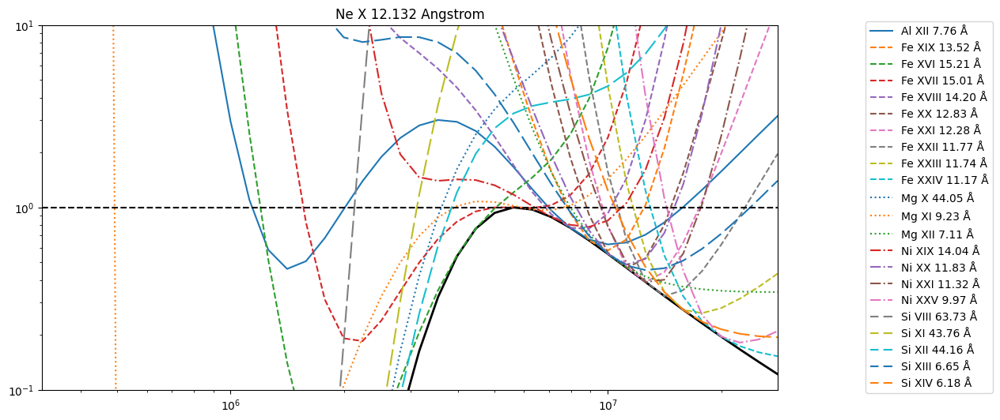

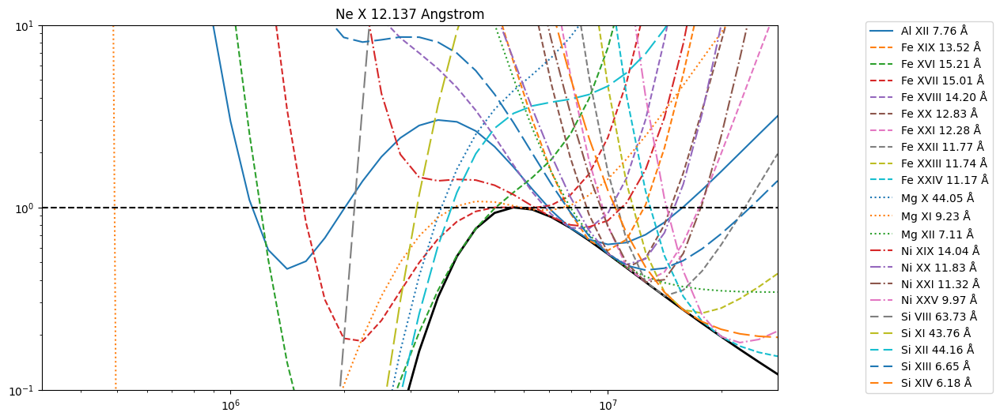

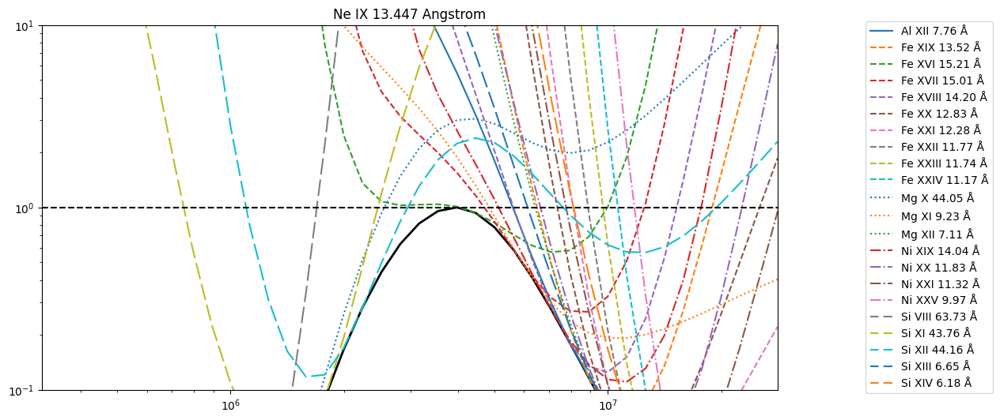

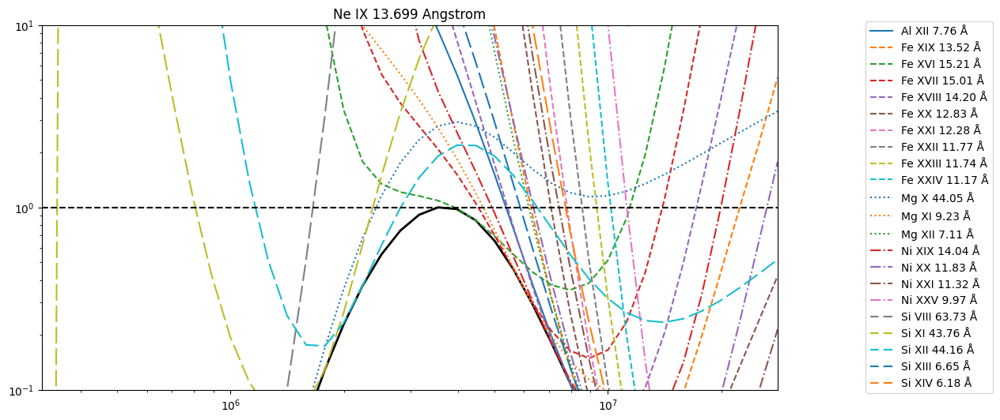

...

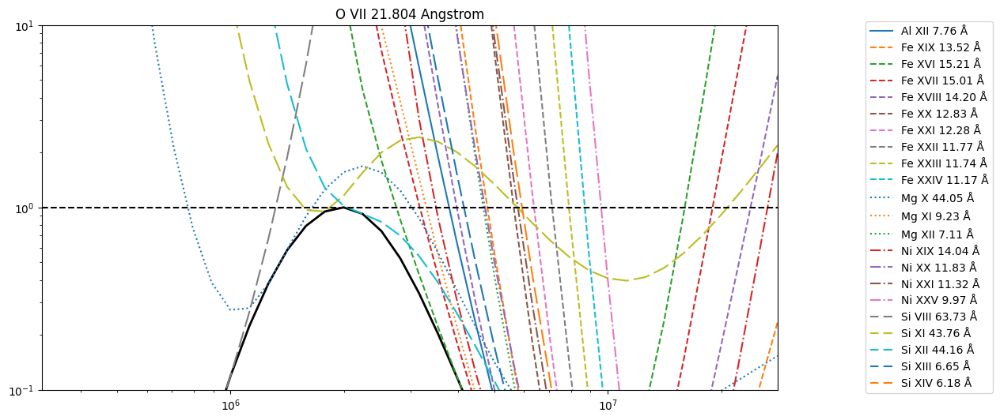

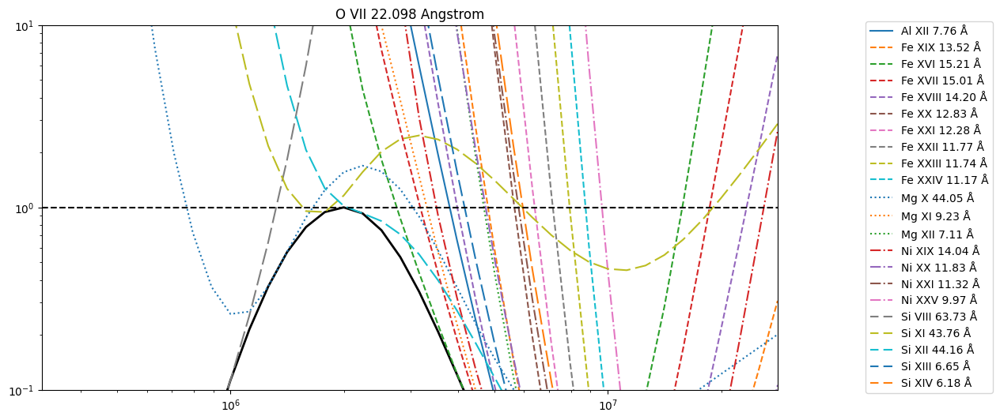

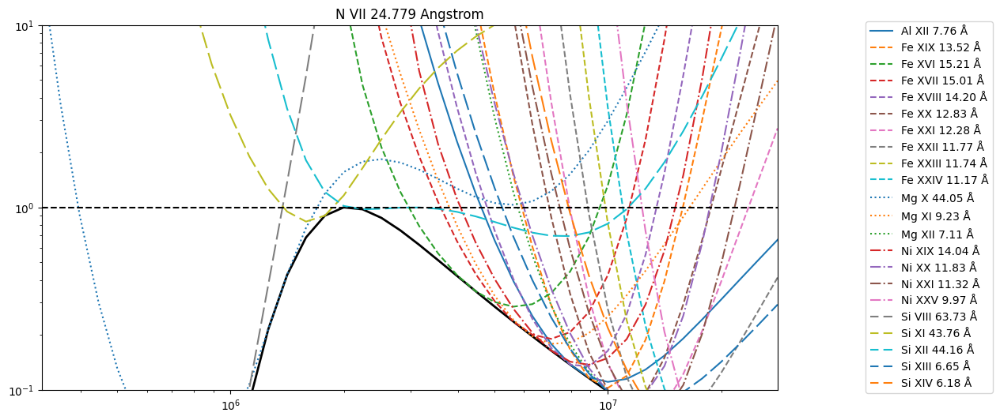

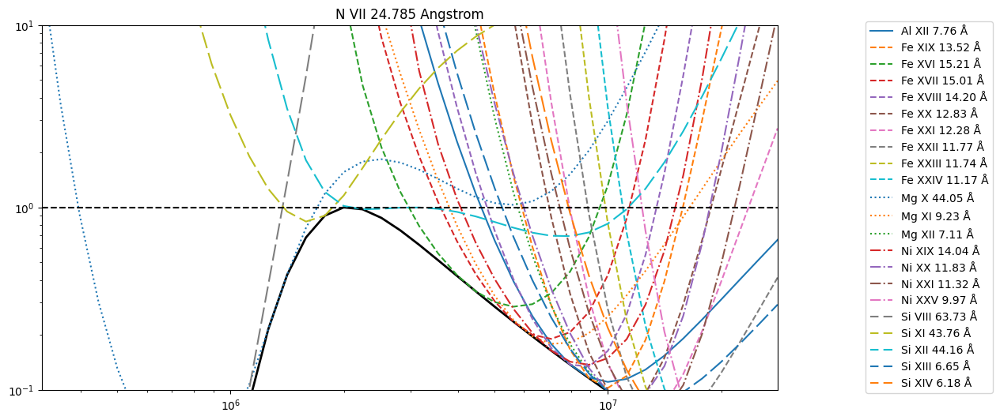

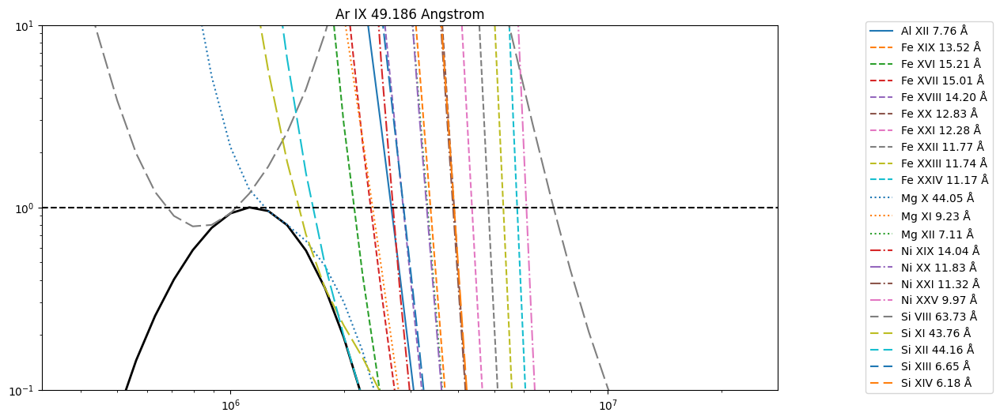

In [22]:
for hf_row in high_fip_lines:#.group_by('ion name').groups:
    #hf_row = tab[np.argsort(tab['flare\_ext'])][-1]
    goft_hf_strongest = hf_row['contribution function']
    goft_hf_strongest /= goft_hf_strongest.max()
    #plt.plot(temperature_grid, goft_hf_strongest, label=hf_row['ion name'])
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot()
    ax.set_title(f"{hf_row['ion name']} {hf_row['wavelength']:.3f}")
    #ax2 = ax.twinx()
    ax.plot(temperature_grid, goft_hf_strongest, color='k', lw=2,)
    for tab_lf in low_fip_lines.group_by('ion name').groups:
        lf_row = tab_lf[np.argsort(tab_lf['flare\_ext'])][-1]
        goft_lf_strongest = lf_row['contribution function']
        goft_lf_strongest /= goft_lf_strongest.max()
        goft_ratio = goft_hf_strongest/goft_lf_strongest
        ax.plot(temperature_grid, goft_hf_strongest/goft_lf_strongest,
                label=f"{lf_row['ion name']} {lf_row['wavelength'].to_value('Angstrom'):.2f} Å",
                ls=el_linestyles[lf_row['ion name'].split()[0]]['linestyle'])
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_ylim(1e-1, 1e1)
    ax.set_xlim(temperature_grid[[0,-1]].value)
    ax.axhline(y=1, ls='--', color='k')
    ax.legend(loc='center right', bbox_to_anchor=(1.3,0.5))

Compute the gradient of this $G(T)$ ratio. Ideally, the ratio approaches 0 near the peak of the contribution function such that there is little temperature sensitivity near where the lines are strongest and thus any differences when taking a ratio are due to changes in abundance.

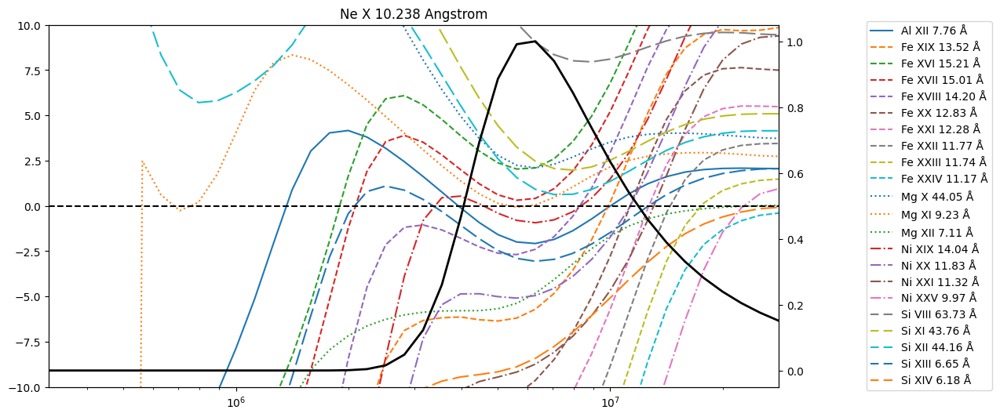

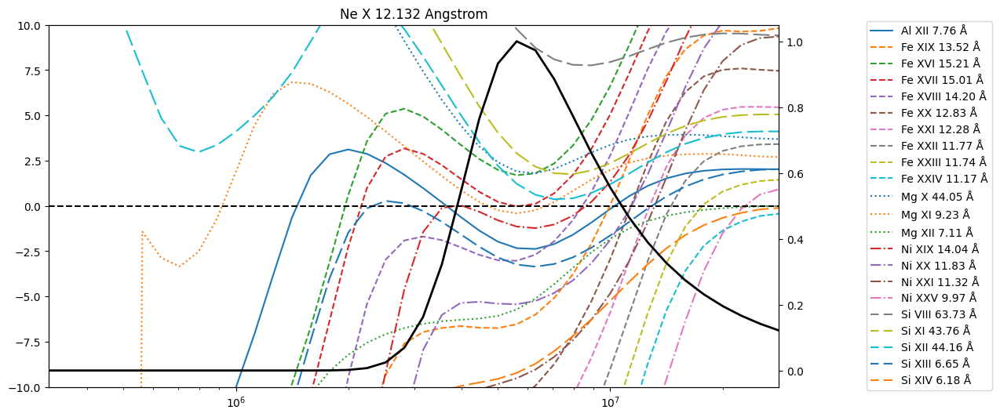

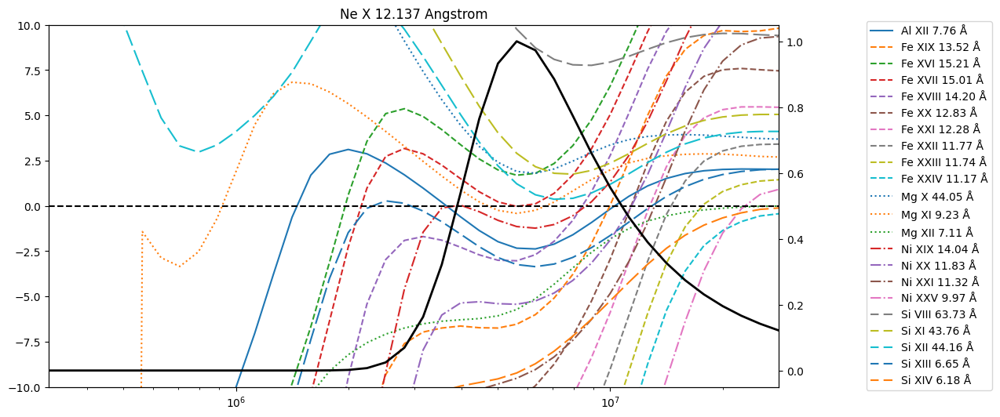

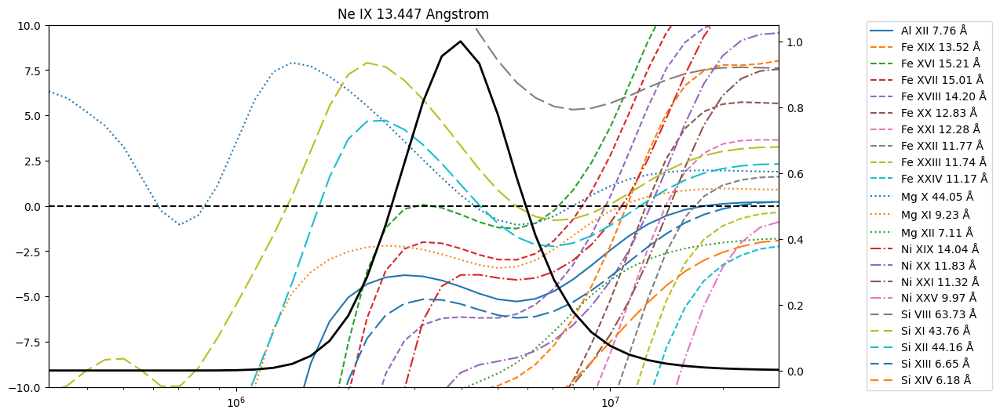

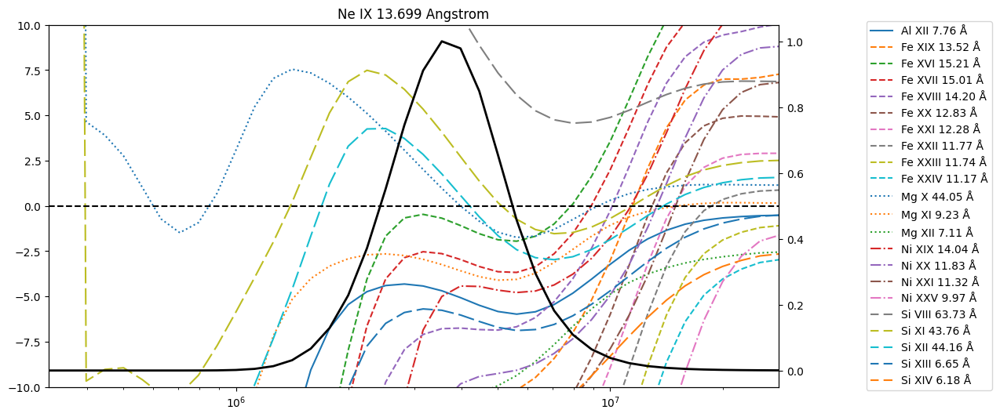

...

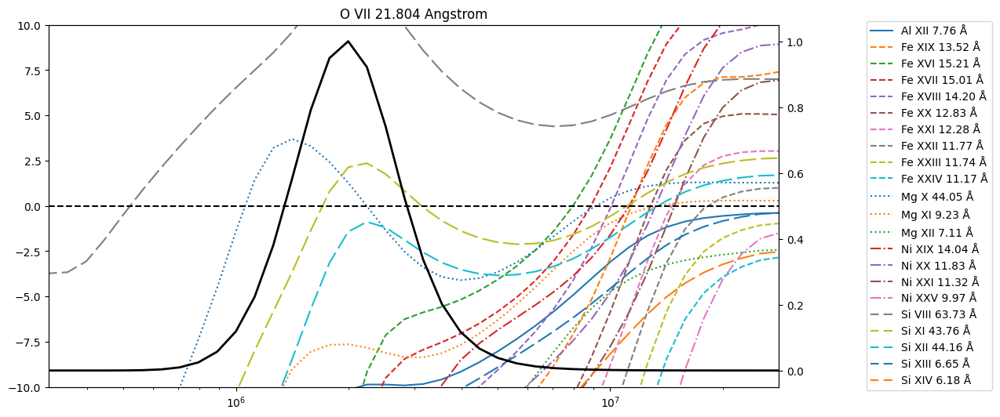

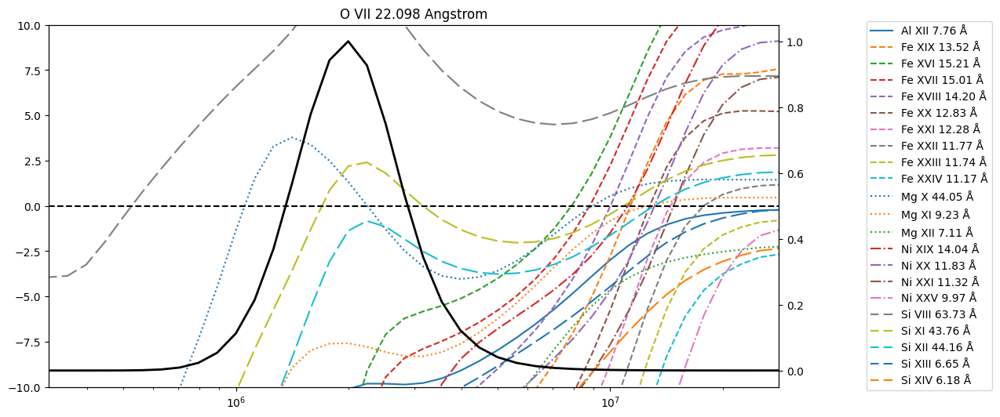

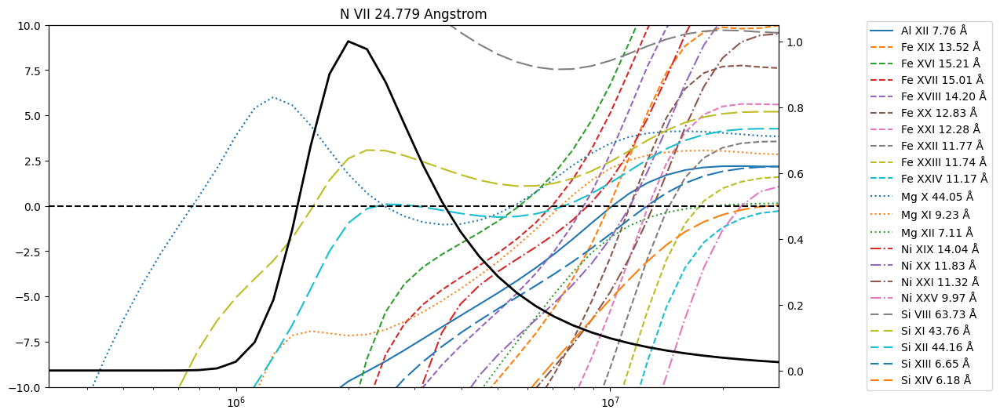

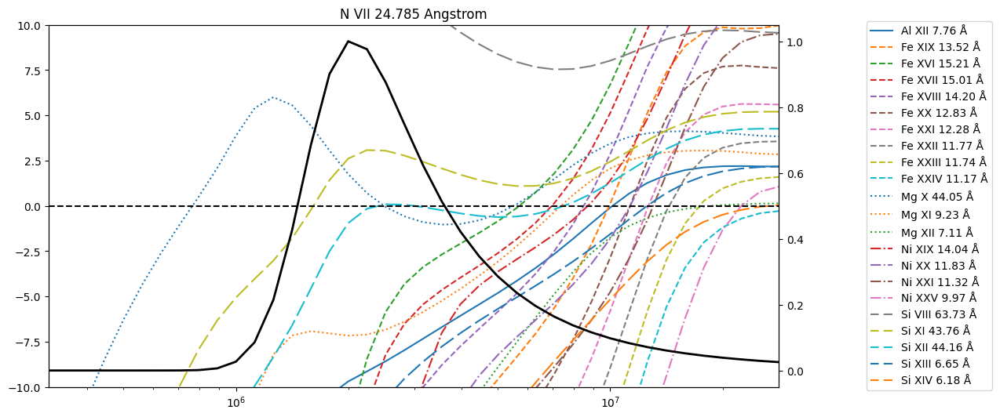

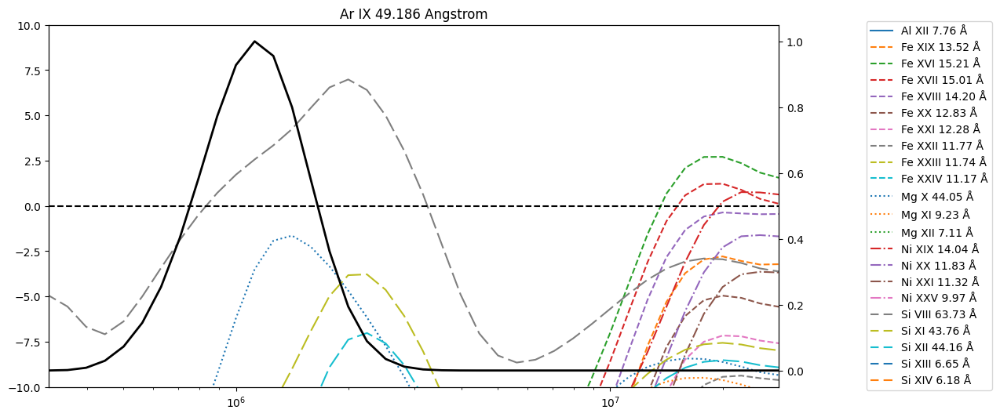

In [118]:
for hf_row in high_fip_lines:#.group_by('ion name').groups:
    #hf_row = tab[np.argsort(tab['flare\_ext'])][-1]
    goft_hf_strongest = hf_row['contribution function']
    goft_hf_strongest #/= goft_hf_strongest.max()
    #plt.plot(temperature_grid, goft_hf_strongest, label=hf_row['ion name'])
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot()
    ax.set_title(f"{hf_row['ion name']} {hf_row['wavelength']:.3f}")
    ax2 = ax.twinx()
    ax2.plot(temperature_grid, goft_hf_strongest, color='k', lw=2,)
    for tab_lf in low_fip_lines.group_by('ion name').groups:
        lf_row = tab_lf[np.argsort(tab_lf['flare\_ext'])][-1]
        goft_lf_strongest = lf_row['contribution function']
        goft_lf_strongest #/= goft_lf_strongest.max()
        goft_ratio = goft_hf_strongest/goft_lf_strongest
        ax.plot(temperature_grid, np.gradient(np.log10(goft_ratio), np.log10(temperature_grid.value)),#goft_hf_strongest/goft_lf_strongest,
                label=f"{lf_row['ion name']} {lf_row['wavelength'].to_value('Angstrom'):.2f} Å",
                ls=el_linestyles[lf_row['ion name'].split()[0]]['linestyle'])
    #ax.set_yscale('log')
    ax.set_xscale('log')
    #ax.set_ylim(1e-3, 5)
    ax.set_ylim(-10,10)
    ax.set_xlim(temperature_grid[[0,-1]].value)
    ax.axhline(y=0, ls='--', color='k')
    ax.legend(loc='center right', bbox_to_anchor=(1.3,0.5))

Write the table to a format that enables easier reading. This is messy but is a convenient way to render the table as a nicely formatted PDF.

In [20]:
import sys
import io
with io.StringIO() as _f:
    flare_snr_table.write(_f,
                          format='ascii.aastex',
                          caption=f'Predicted flare line intensities for MOXSI assuming a source is confined to a single pixel located at disk center at the center of the detector. Lines with an M1 intensity below {threshold:latex_inline} are not included. The flare\\_ext column refers to the CHIANTI flare\\_ext DEM. These intensities are calculated per line. Lines that share a pixel and have flare\\_ext below {max_threshold} of the maximum flare\\_ext in that pixel are also excluded.',
                          #latexdict={'tabletype':'longtable'},
                          formats={
                              'MOXSI pixel': '%d',
                              'wavelength':'%.3f',
                              'energy':'%.3f',
                              '$T_{max}$': '%.1f',
                              '$T_{max,G}$': '%.1f',
                              'IP': '%.1f',
                              r'flare\_ext': '%.3g',
                          #    r'active\_region': '%.3f',
                              **{k.upper(): '%.3f' for k in goes_class}
                          },
                          overwrite=True)
    table_string = _f.getvalue()
md_file = f"""---
title: "MOXSI Flare Lines"
author:
- name: Will Barnes
aastexopts: [singlecolumn]
---

\startlongtable
{table_string}
"""
with open('line-table.md', mode='w') as f:
    f.write(md_file)
!pandoc --template aastex63_template.tex line-table.md -o line-table.pdf

These were the lines that I manually selected based on their relative strength and the criteria that the lines should be reasonably well-separated in first order. Thes critieria were somewhat subjective, but represent a first cut at identifying the lines that have the most diagnostic potential.

In [229]:
selected_lines = [
    ('Si XIV	6.180'),
    ('Si XIII	6.648'),
    ('Mg XII	7.106'),
    ('Mg XI	9.231'),
    ('Fe XXI	9.475'),
    ('Fe XIX	9.691'),
    ('Ni XXV	9.967'),
    ('Ne X	10.238'),
    ('Fe XXIV	10.619'),
    ('Fe XXIII	10.980'),
    ('Fe XXIII	11.737'),
    ('Fe XXII	11.767'),
    ('Ni XX	11.832'),
    ('Fe XIX	13.525'),
    ('Fe XX	13.545'),
    ('Ni XIX	14.040'),
    ('Fe XVIII	14.204'),
    ('Fe XVII	15.013'),
    ('Fe XVIII	16.072'),
    ('Fe XVII	17.051'),
    ('O VIII	18.967'),
    ('O VII	21.601'),
    ('N VII	24.779'),
    ('Si XI	43.762'),
    ('Mg X	44.050'),
    ('Si XII	44.160'),
    ('Fe XVI	50.361'),
    ('Si VIII	63.732'),
]
selected_lines = [l.split() for l in selected_lines]
selected_lines = [(f'{l[0]} {l[1]}', float(l[2])*u.AA) for l in selected_lines]
selected_table = []
for ion_name, wavelength in selected_lines:
    _tab = flare_snr_table[flare_snr_table['ion name'] == ion_name]
    _idx = np.argmin(np.fabs(_tab['wavelength']-wavelength))
    selected_table.append(_tab[_idx])
selected_table = astropy.table.vstack(selected_table,)
selected_table.meta = {}
#selected_table
selected_table[['ion name', 'wavelength', 'FIP', 'M1', 'M5', 'X5']].write(
    sys.stdout,
    format='ascii.fixed_width_no_header',
    formats={
        'MOXSI pixel': '%d',
        'wavelength':'%.3f',
        #'energy':'%.3f',
        #'$T_{max}$': '%.1f',
        #r'flare\_ext': '%.3g',
        **{k.upper(): '%.3f' for k in goes_class}
    },
)

|   Si XIV |  6.180 |  low | 0.191 |  0.773 |   5.959 |
|  Si XIII |  6.648 |  low | 0.389 |  1.699 |  16.016 |
|   Mg XII |  7.106 |  low | 0.166 |  0.718 |   6.601 |
|    Mg XI |  9.231 |  low | 0.326 |  1.380 |  13.309 |
|   Fe XXI |  9.475 |  low | 0.150 |  0.380 |   2.515 |
|   Fe XIX |  9.691 |  low | 0.112 |  0.467 |   4.468 |
|   Ni XXV |  9.967 |  low | 0.131 |  0.572 |   5.512 |
|     Ne X | 10.238 | high | 0.108 |  0.454 |   4.337 |
|  Fe XXIV | 10.619 |  low | 0.152 |  0.717 |   6.446 |
| Fe XXIII | 10.980 |  low | 0.174 |  0.600 |   3.470 |
| Fe XXIII | 11.737 |  low | 0.508 |  1.788 |  10.485 |
|  Fe XXII | 11.767 |  low | 0.176 |  0.422 |   1.695 |
|    Ni XX | 11.832 |  low | 0.105 |  0.437 |   4.166 |
|   Fe XIX | 13.525 |  low | 0.242 |  1.007 |   9.706 |
|    Fe XX | 13.545 |  low | 0.242 |  1.007 |   9.706 |
|   Ni XIX | 14.040 |  low | 0.516 |  2.369 |  23.403 |
| Fe XVIII | 14.204 |  low | 1.501 |  7.086 |  70.478 |
|  Fe XVII | 15.013 |  low | 6.078 | 25.602 | 24

Look at some contribution functions to assess the relative thermal sensitivity of some lines

In [125]:
si_13 = fiasco.Ion('Si XIII', np.logspace(5,8,1000)*u.K)
si_12 = fiasco.Ion('Si XII', si_13.temperature)
ne_10 = fiasco.Ion('Ne X', si_13.temperature)
o_8 = fiasco.Ion('O VIII', si_13.temperature)
fe_16 = fiasco.Ion('Fe XVI', si_13.temperature)
fe_17 = fiasco.Ion('Fe XVII', si_13.temperature)
si_11 = fiasco.Ion('Si XI', si_13.temperature)
n_7 = fiasco.Ion('N VII', si_13.temperature)
ni_19 = fiasco.Ion('Ni XIX', si_13.temperature)
mg_11 = fiasco.Ion('Mg XI', si_13.temperature)

In [126]:
#goft_si13 = si_13.contribution_function(1e9*u.cm**(-3))
#_idx = np.argmin(np.fabs(si_13.transitions.wavelength[~si_13.transitions.is_twophoton] - 6.6479*u.AA))
#goft_si13 = goft_si13.squeeze()[:,_idx]

goft_si11 = si_11.contribution_function(1e9*u.cm**(-3))
_idx = np.argmin(np.fabs(si_11.transitions.wavelength[~si_11.transitions.is_twophoton] - 49.176*u.AA))
goft_si11 = goft_si11.squeeze()[:,_idx]

goft_n7 = n_7.contribution_function(1e9*u.cm**(-3))
_idx = np.argmin(np.fabs(n_7.transitions.wavelength[~n_7.transitions.is_twophoton] - 24.779*u.AA))
goft_n7 = goft_n7.squeeze()[:,_idx]

goft_ni19 = ni_19.contribution_function(1e9*u.cm**(-3))
_idx = np.argmin(np.fabs(ni_19.transitions.wavelength[~ni_19.transitions.is_twophoton] - 14.040*u.AA))
goft_ni19 = goft_ni19.squeeze()[:,_idx]

# goft_si12 = si_12.contribution_function(1e9*u.cm**(-3))
# _idx = np.argmin(np.fabs(si_12.transitions.wavelength[~si_12.transitions.is_twophoton] - 44.16030*u.AA))
# goft_si12 = goft_si12.squeeze()[:,_idx]

goft_ne10 = ne_10.contribution_function(1e9*u.cm**(-3))
transitions = [10.23849, 12.13210,]*u.AA
_idx = [np.argmin(np.fabs(ne_10.transitions.wavelength[~ne_10.transitions.is_twophoton] - t)) for t in transitions]
goft_ne10 = goft_ne10.squeeze()[:,_idx]

goft_o8 = o_8.contribution_function(1e9*u.cm**(-3))
_idx = np.argmin(np.fabs(o_8.transitions.wavelength[~o_8.transitions.is_twophoton] - 18.9671*u.AA))
goft_o8 = goft_o8.squeeze()[:,_idx]

goft_mg11 = mg_11.contribution_function(1e9*u.cm**(-3))
_idx = np.argmin(np.fabs(mg_11.transitions.wavelength[~mg_11.transitions.is_twophoton] - 9.231*u.AA))
goft_mg11 = goft_mg11.squeeze()[:,_idx]

#goft_fe16 = fe_16.contribution_function(1e9*u.cm**(-3))
#_idx = np.argmin(np.fabs(fe_16.transitions.wavelength[~fe_16.transitions.is_twophoton] - 50.361*u.AA))
#goft_fe16 = goft_fe16.squeeze()[:,_idx]

#goft_fe17 = fe_17.contribution_function(1e9*u.cm**(-3))
#transitions = [15.013, 17.051,]*u.AA
#_idx = [np.argmin(np.fabs(fe_17.transitions.wavelength[~fe_17.transitions.is_twophoton] - t)) for t in transitions]
#goft_fe17 = goft_fe17.squeeze()[:,_idx]

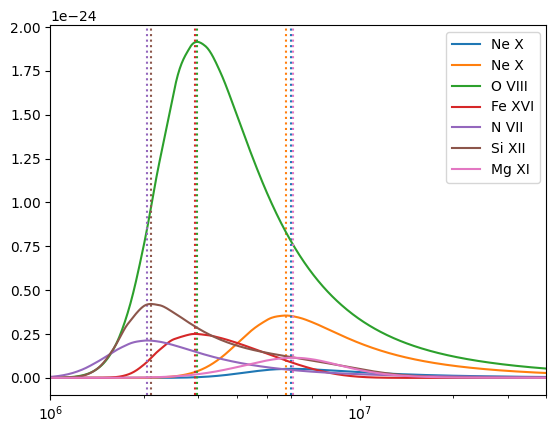

In [134]:
for _ion,_goft in [(ne_10, goft_ne10),
                   (o_8, goft_o8),
                   (fe_16,goft_fe16),
                   #(fe_17, goft_fe17),
                   (n_7, goft_n7),
                   #(si_11,goft_si11),
                   (si_12,goft_si12),
                   #(si_13,goft_si13),
                   #(ni_19,goft_ni19),
                   (mg_11,goft_mg11)]:
    l = plt.plot(_ion.temperature, _goft, label=_ion.ion_name_roman)
    if len(_goft.shape) == 1:
        _goft = _goft[:,np.newaxis]
    for i in range(_goft.shape[1]):
        plt.axvline(x=_ion.temperature[np.argmax(_goft[:,i])].to_value('K'), color=l[i].get_color(), ls=':')

plt.xscale('log')
#plt.yscale('log')
#plt.ylim(1e-27, 8e-24)
plt.xlim(1e6,4e7)
plt.legend()

In [82]:
ions_unique = np.unique(flare_snr_table['ion name'])

(200000.0, 100000000.0)

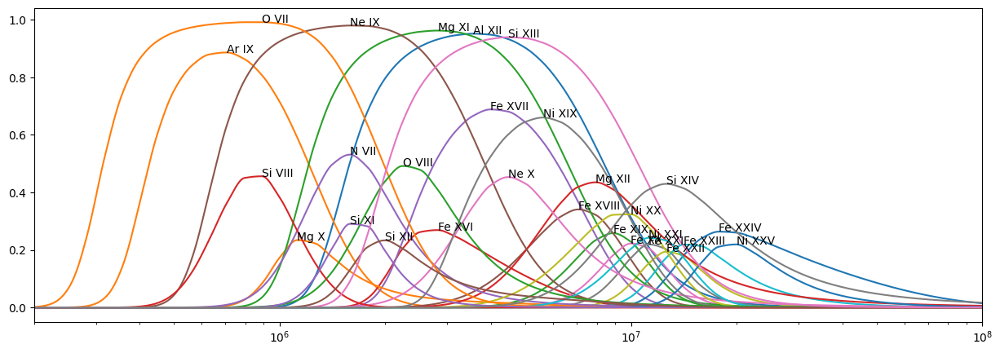

In [89]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot()
for i in ions_unique:
    _ion = fiasco.Ion(i, np.logspace(4,8,10000)*u.K)
    ax.plot(_ion.temperature, _ion.ioneq,)
    ax.text(_ion.formation_temperature.value, _ion.ioneq.max(), _ion.ion_name_roman)
plt.xscale('log')
plt.xlim(2e5,1e8)

How does this compare to our previous curated line list?

In [11]:
curated_line_list = astropy.table.QTable.read('../data/line_lists/curated_line_list.asdf')

In [12]:
curated_line_list

ion name,wavelength,T_max (Maxwellian),T_max (kappa=2),temperature diagnostic,density diagnostic,kappa diagnostic,sass,moxsi,flare line,active region line
,Angstrom,K,K,,,,,,,
str8,float64,float64,float64,bool,bool,bool,bool,bool,bool,bool
Fe XXV,1.86,31622776.60168379,31622776.60168379,True,False,False,True,False,True,False
Ca XIX,3.21,25118864.315095823,31622776.60168379,True,False,False,True,False,True,False
Si XIV,6.1804,16185305.906356486,nan,True,False,False,True,True,True,True
Si XIII,6.74,10000000.0,12589254.117941663,True,False,False,True,True,True,False
Mg XII,8.419,10000000.0,15848931.924611142,True,False,False,True,True,True,False
Mg XI,9.169,6309573.44480193,10000000.0,True,False,False,False,True,True,True
Mg XI,9.314,6309573.44480193,10000000.0,True,False,False,False,True,True,True
Fe XXIV,11.171,19952623.149688788,31622776.60168379,True,False,False,True,True,True,False


Do some visual checks

In [20]:
blur = 40 * u.arcsec 

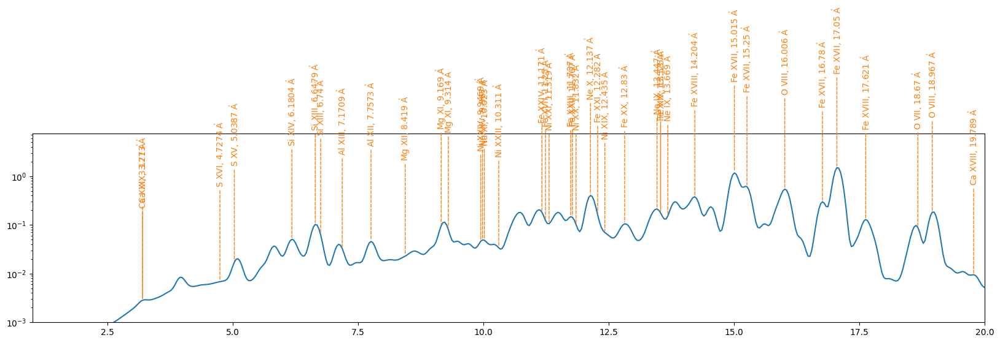

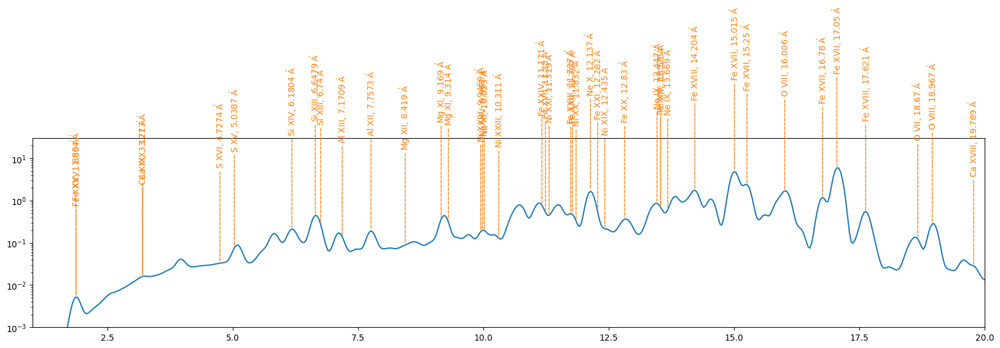

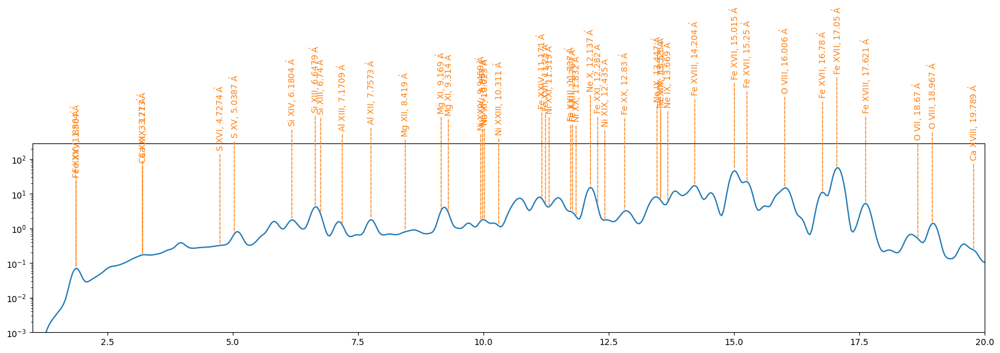

In [25]:
for gc in goes_class:
    fig = plt.figure(figsize=(20,4))
    ax = fig.add_subplot()
    flux = convolve_with_response(flare_spectra[gc], channel_o1, electrons=False, include_gain=False)
    flux = _blur_spectra(flux, blur / channel_o1.spatial_plate_scale[0] * channel_o1.spectral_plate_scale, channel_o1)
    ax.plot(flux.axis_world_coords(0)[0], flux.data)
    annotate_lines(ax, combined_line_list, flux, 'C1', rtol=0.0)
    ax.set_yscale('log')
    ax.set_xlim(1,20)
    ax.set_ylim(1e-3,flux.data.max()*5)